In [1]:
!python --version

Python 3.8.10


In [2]:
!pip install plotly missingno haversine Pyomo -q

In [3]:
!conda install glpk -y 

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.10.1
  latest version: 23.3.1

Please update conda by running

    $ conda update -n base conda



# All requested packages already installed.



In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px #graphing
import matplotlib.pyplot as plt #graphing
import seaborn as sns #graphing
import missingno as msno #describe data
import os
from haversine import haversine, Unit
import pyomo.environ as pyo

sns.set(rc = {"figure.figsize":(10, 6)})

In [5]:
df = pd.read_csv("celltowers.csv")

In [6]:
df.head()

,id,license,address,city,county,state,structure,structure_type,latitude,longitude
0,20486,AT&T,"S3, T12N, R10W (101378)",Tyonek,KENAI PENINSULA,AK,50.3,LTOWER,61.164778,-151.043806
1,20485,AT&T,MP 179 Parks Hwy (101380),Cantwell,MATANUSKA-SUSITNA,AK,75.6,GTOWER,63.094000,-149.507000
2,20484,AT&T,8751 EAST MILE 6 ROAD (94021),Wasilla,MATANUSKA-SUSITNA,AK,30.8,MTOWER,61.680222,-149.231194
3,20483,AT&T,HC01 Box 2547 (101366),Glennallen,VALDEZ-CORDOVA,AK,39.0,MTOWER,62.027389,-146.635556
4,20482,AT&T,65855 Dimond Ridge Road (93995),Homer,KENAI PENINSULA,AK,25.9,LTOWER,59.680472,-151.624333


In [7]:
df.shape

(19938, 10)

In [8]:
df.describe().style.background_gradient(cmap = "Purples")

,id,structure,latitude,longitude
count,19938.000000,19938.000000,19938.000000,19938.000000
mean,23497.454308,80.480595,38.295953,-93.862058
std,14049.533011,35.366244,5.964717,13.847930
min,1.000000,3.000000,19.002139,-165.410278
25%,10866.250000,57.900000,33.743417,-100.202222
50%,23562.000000,79.900000,38.459889,-91.505222
75%,35817.750000,97.500000,42.295056,-84.377625
max,47327.000000,609.600000,65.034250,-3.944389


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19938 entries, 0 to 19937
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              19938 non-null  int64  
 1   license         19938 non-null  object 
 2   address         19938 non-null  object 
 3   city            19938 non-null  object 
 4   county          19938 non-null  object 
 5   state           19938 non-null  object 
 6   structure       19938 non-null  float64
 7   structure_type  19938 non-null  object 
 8   latitude        19938 non-null  float64
 9   longitude       19938 non-null  float64
dtypes: float64(3), int64(1), object(6)
memory usage: 1.5+ MB


In [10]:
vidor = df[df["city"] == "Vidor"].index
df.drop(vidor, inplace = True)

In [11]:
df1 = df.copy()

# Goodbye Alaska and Hawaii

hi = df1[df1["state"] == "HI"].index
ak = df1[df1["state"] == "AK"].index
vidor = df1[df1["city"] == "Vidor"].index

df1.drop(hi, inplace = True)
df1.drop(ak, inplace = True)
df1.drop(vidor, inplace = True)

Text(0.5, 1.0, 'Number of Cellular Towers by State')

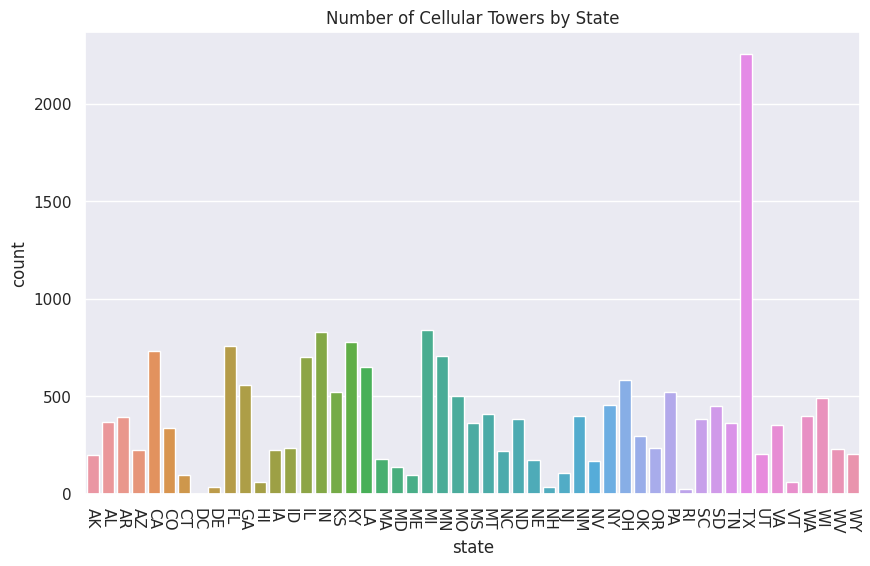

In [12]:
sorted_df = df.sort_values(by = "state", ascending = True)

plot = sns.countplot(data = sorted_df, x = "state")
plot.set_xticklabels(plot.get_xticklabels(), rotation = 270)
plt.title("Number of Cellular Towers by State")

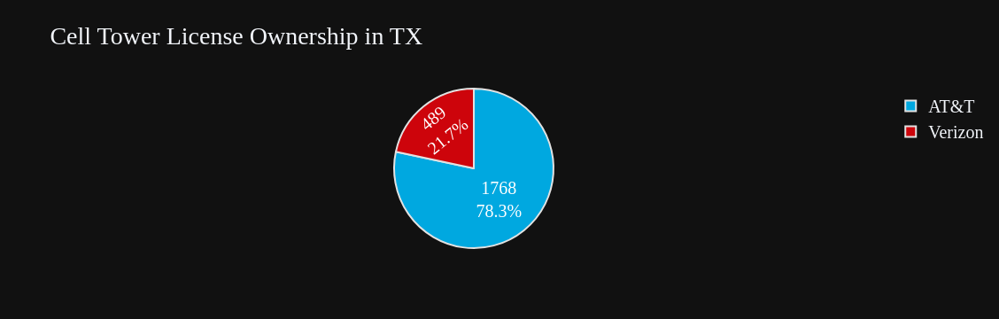

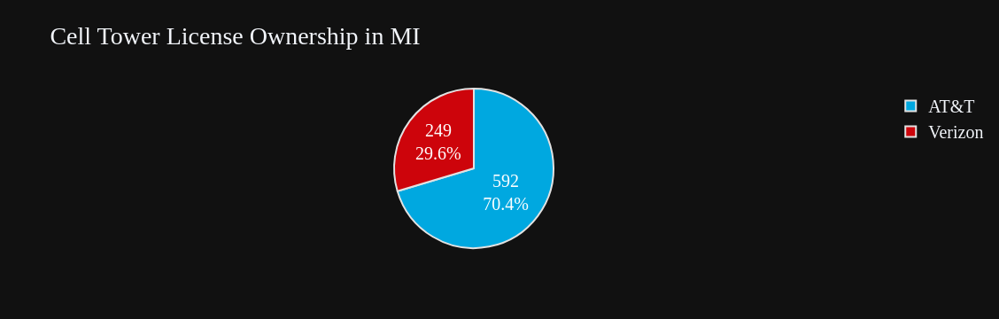

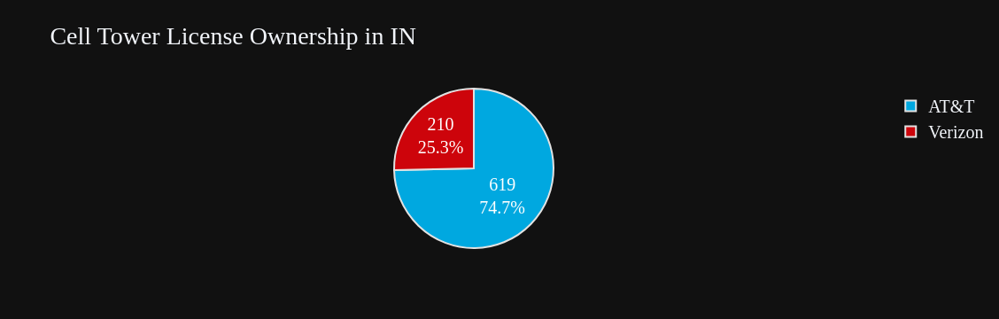

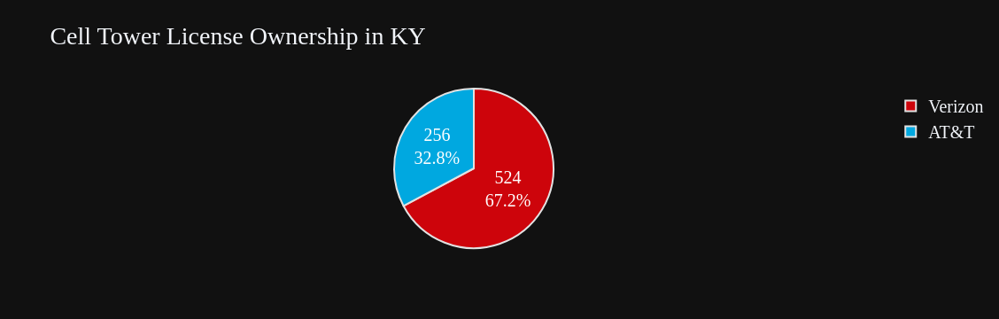

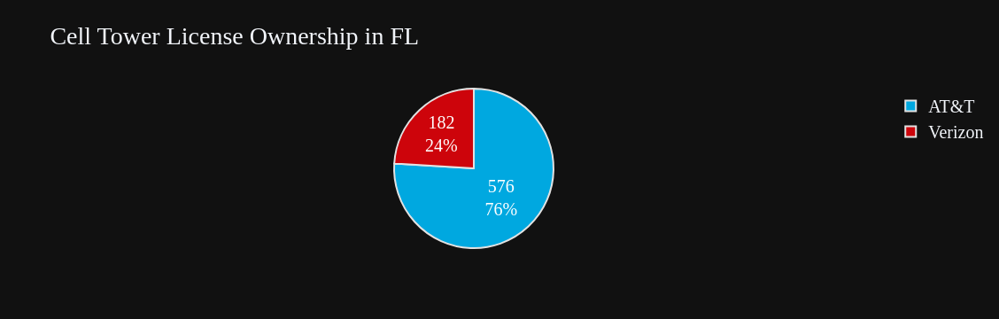

...

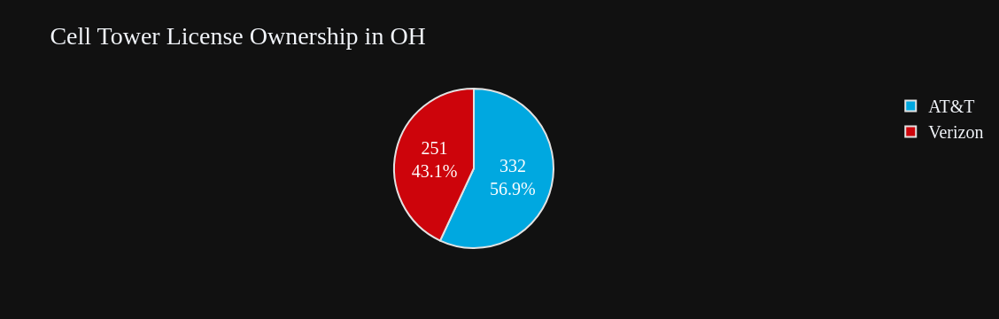

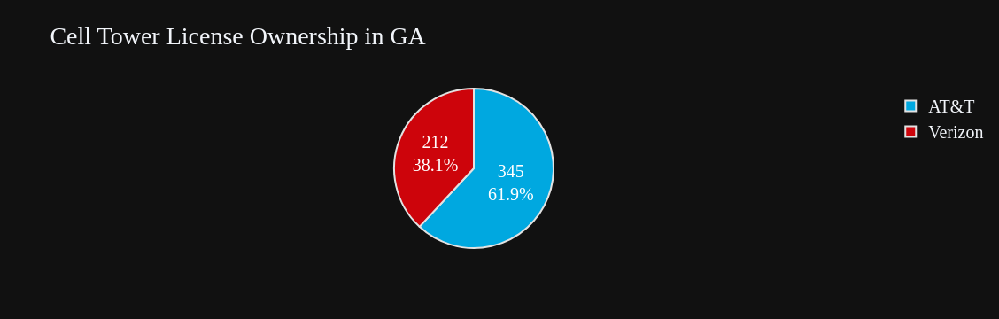

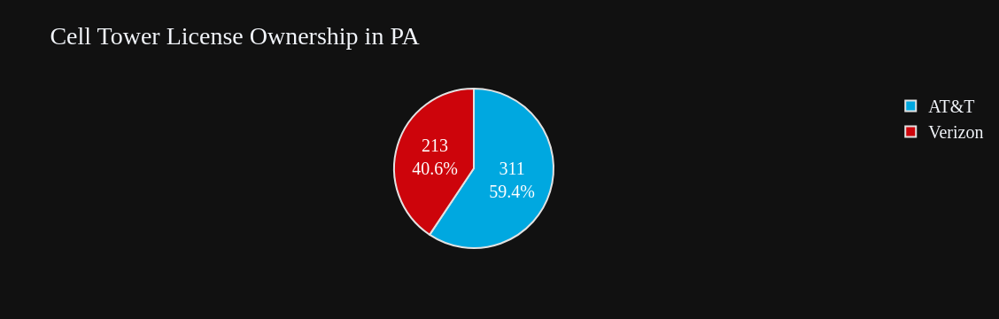

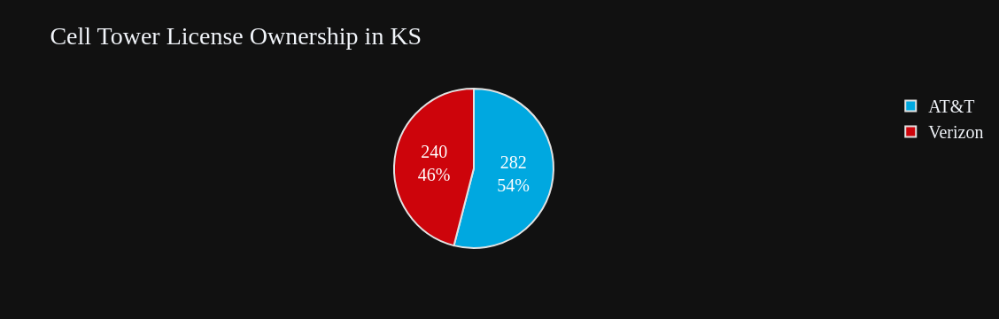

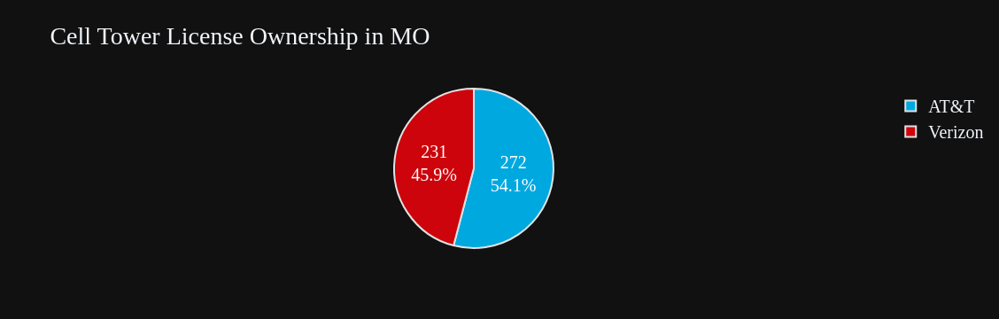

In [13]:
for state in ["TX","MI","IN","KY","FL","CA","MN","IL","LA","OH","GA","PA","KS","MO"]:

    dfstate = df[df["state"] == state]

    fig = px.pie(dfstate, names = "license", color = "license", 
                 title = f"Cell Tower License Ownership in {state}",
                 color_discrete_map = {"AT&T": "#00A8E0", "Verizon": "#cd040b"})

    fig.update_traces(textinfo = "value+percent", textfont_size = 20,
                      marker = dict(line = dict(color = "#E2E2E2", width = 2)))

    fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
    fig.show()

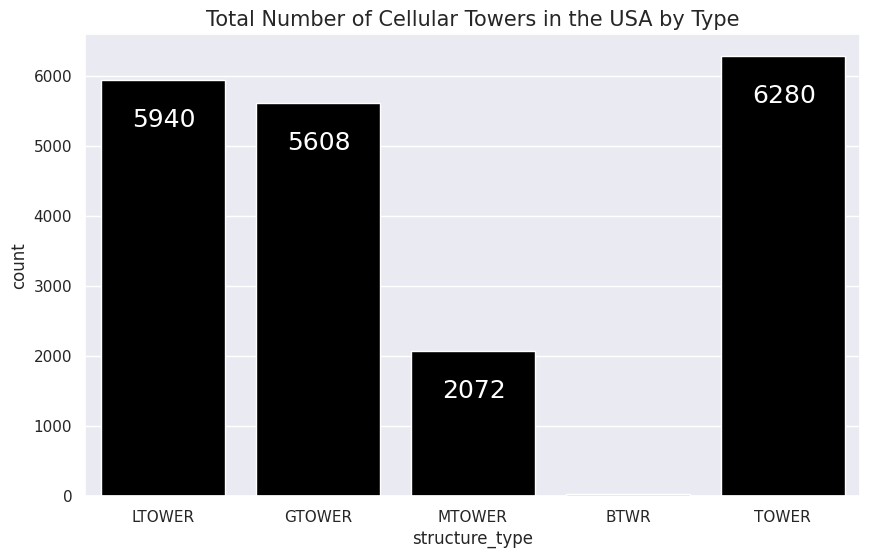

In [14]:
# Total Number of Cellular Towers in the USA by Type
ax = sns.countplot(data = df, x = "structure_type", palette = ["#000000"])
ax.set_title("Total Number of Cellular Towers in the USA by Type", fontsize = 15)

for p in ax.patches:
    ax.annotate(f"\n{p.get_height()}", (p.get_x()+0.2, p.get_height()),
                va = "top", color = "#FFFFFF", size = 18)

plt.show()

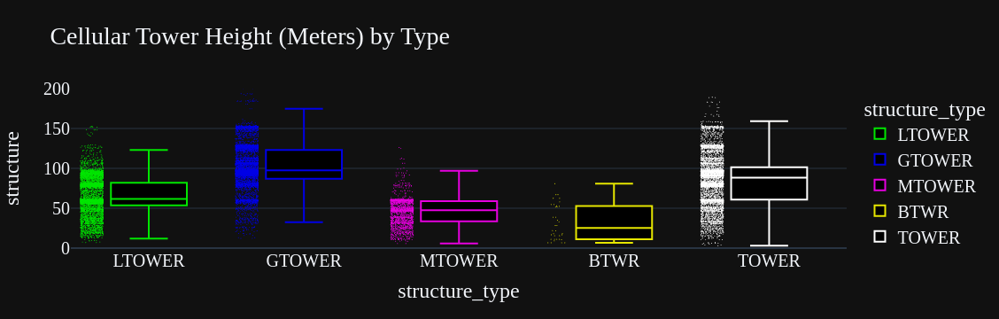

In [15]:
fig = px.box(df, x = "structure_type", y = "structure", color = "structure_type", points = "all",
             color_discrete_sequence = ["#00E600", "#0000E6", "#E600DF", "#E6E600", "#FFFFFF"],
             title = "Cellular Tower Height (Meters) by Type")

fig.update_layout(template = "plotly_dark", yaxis_range = [0, 200], # setting range of y axis
                  font = dict(family = "PT Sans", size = 20))

fig.update_traces(fillcolor = "#000000")
fig.update_traces(marker = dict(size = 1)) # and scaling down the markers
fig.show()

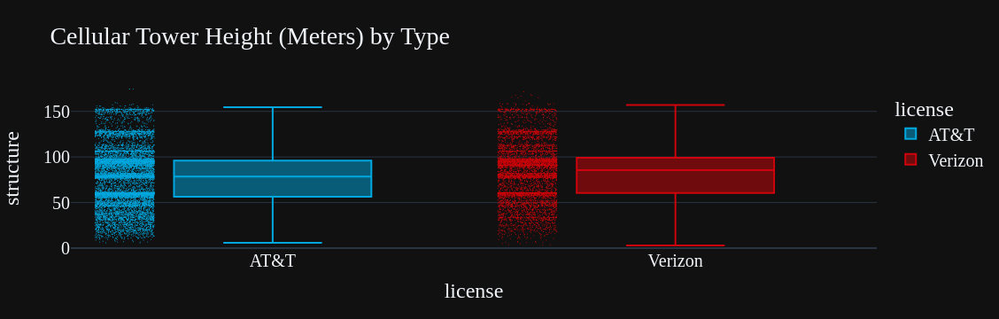

In [16]:
fig = px.box(df, x = "license", y = "structure", color = "license", points = "all",
             color_discrete_sequence = ["#00A8E0", "#cd040b"],
             title = "Cellular Tower Height (Meters) by Type")

fig.update_layout(template = "plotly_dark", yaxis_range = [0, 175], # setting range of y axis
                  font = dict(family = "PT Sans", size = 20))

fig.update_traces(marker = dict(size = 1)) # and scaling down the markers
fig.show()

In [17]:
# License distribution
df.value_counts("license")

license
AT&T       12270
Verizon     7666
dtype: int64

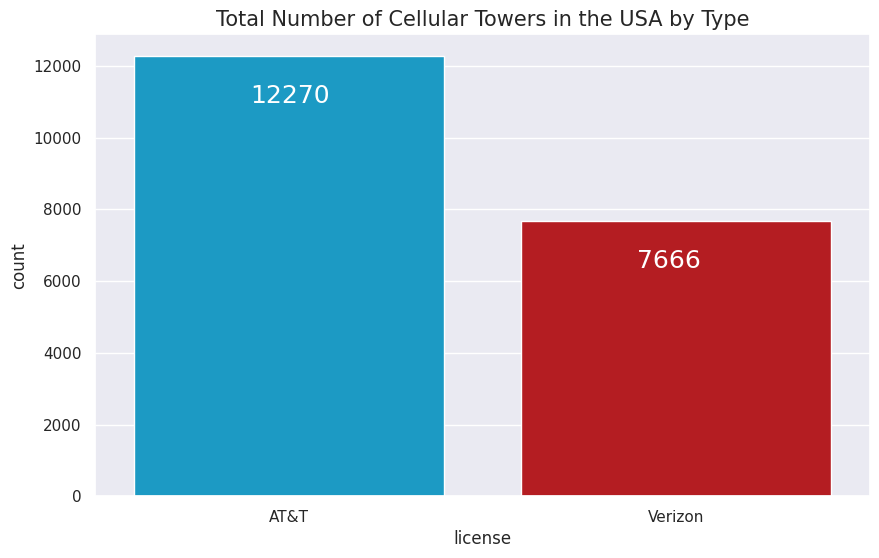

In [18]:
ax = sns.countplot(data = df, x = "license", palette = ["#00A8E0", "#cd040b"])
ax.set_title("Total Number of Cellular Towers in the USA by Type", fontsize = 15)

for p in ax.patches:
    ax.annotate(f"\n{p.get_height()}", (p.get_x() + 0.3, p.get_height()),
                va = "top", color = "#FFFFFF", size = 18)

plt.show()

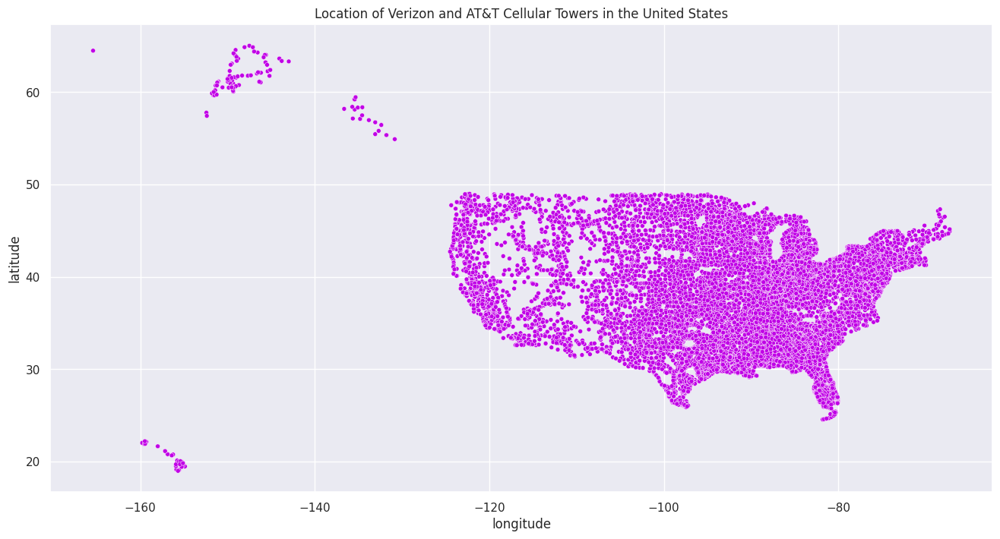

In [19]:
plt.figure(figsize = (16, 8))
sns.scatterplot(data = df, x = "longitude", y = "latitude", size = 2)
plt.title("Location of Verizon and AT&T Cellular Towers in the United States")
plt.legend([],[], frameon = False)

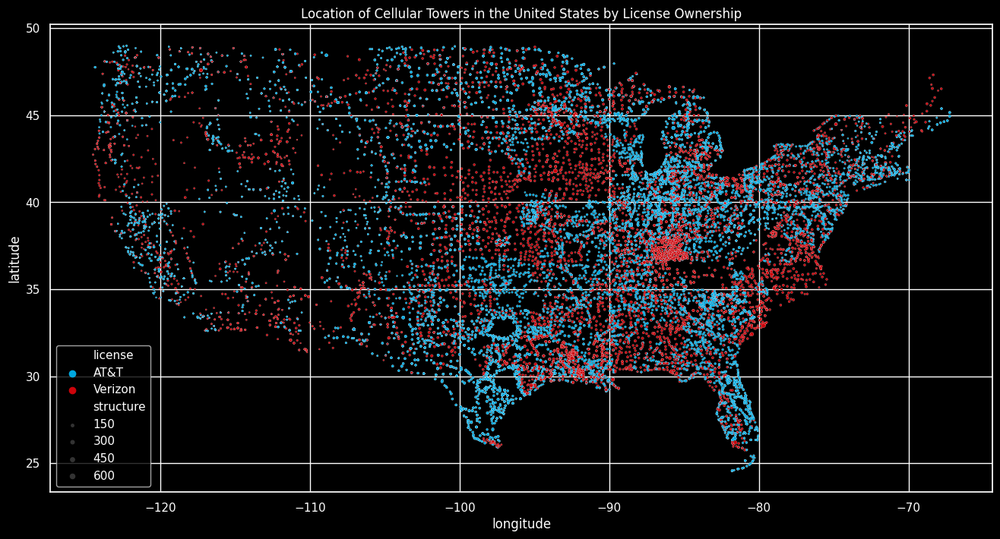

In [20]:
plt.style.use("dark_background")
plt.figure(figsize = (16, 8))
sns.scatterplot(data = df1, x = "longitude", y = "latitude", hue = "license", 
                size = "structure", sizes = (2, 20), # marker sizes
                palette = ("#00A8E0", "#cd040b"))

plt.title("Location of Cellular Towers in the United States by License Ownership")
plt.legend()

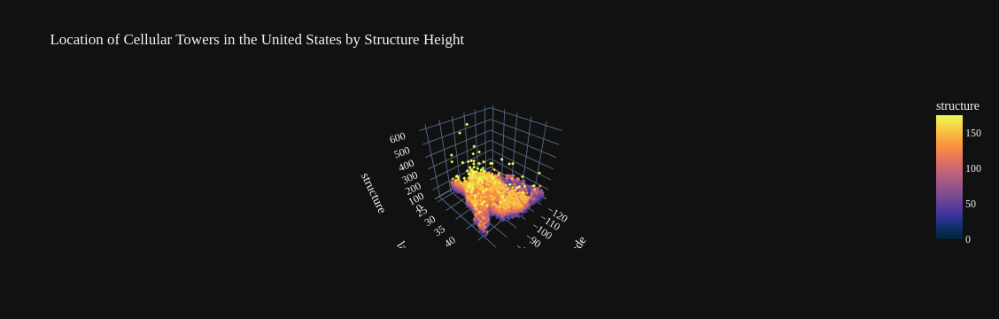

In [21]:
fig = px.scatter_3d(df1, x = "longitude", y = "latitude", z = "structure",
                    color = "structure", color_continuous_scale = "Thermal",
                    range_color = (0, 175), # range of color bar
                    title = "Location of Cellular Towers in the United States by Structure Height")

fig.update_traces(marker = dict(size = 1.25, symbol = "diamond")) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

No handles with labels found to put in legend.


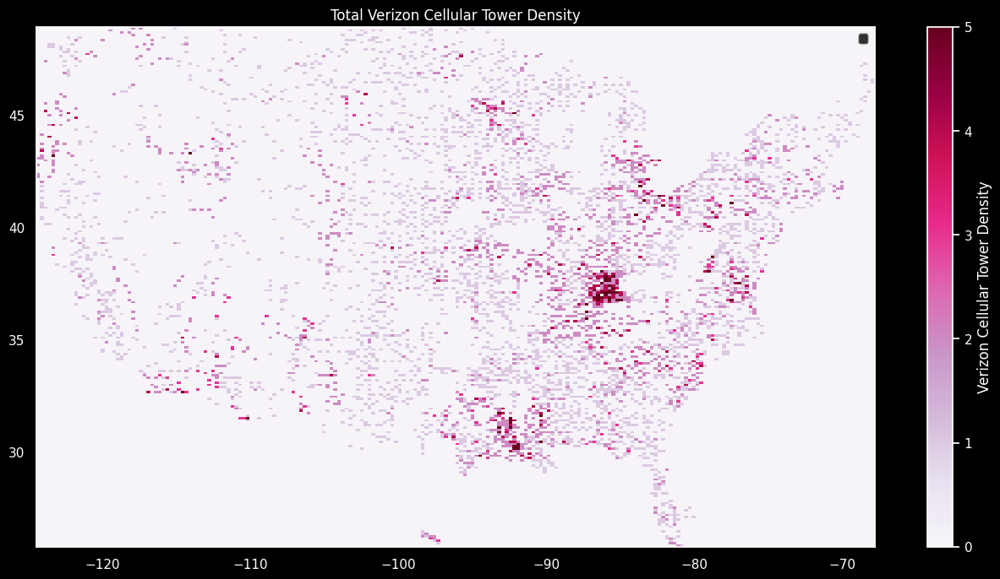

In [22]:
# Verizon Tower Density
plt.figure(figsize = (16, 8))

df0 = df1[df1["license"] == "Verizon"]

plt.hist2d(data = df0, x = "longitude", y = "latitude", bins = 220, cmap = "PuRd")
        
plt.colorbar(label = "Verizon Cellular Tower Density", orientation = "vertical") 
plt.clim(0,5) # Limits range of color bar
plt.title("Total Verizon Cellular Tower Density")
plt.legend()

No handles with labels found to put in legend.


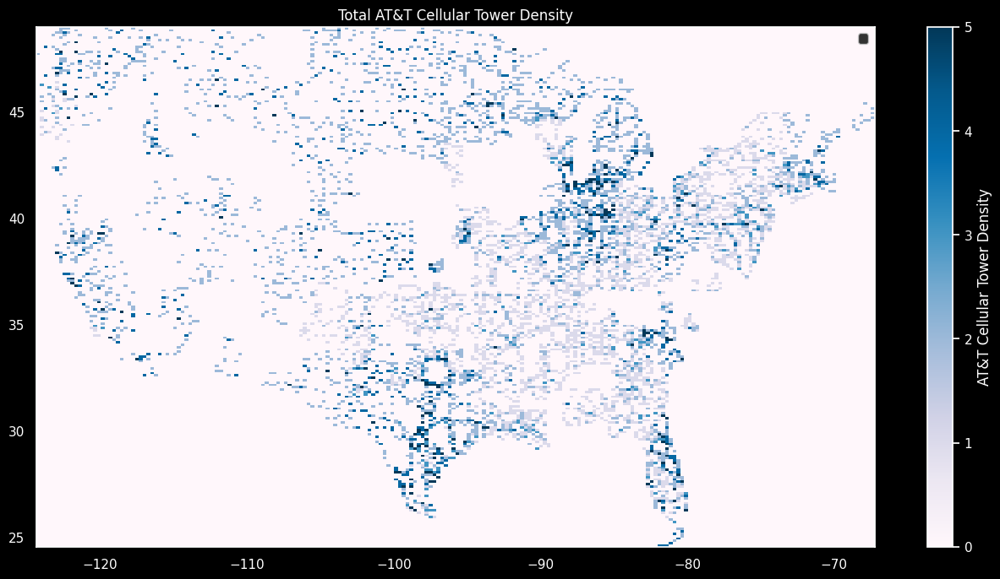

In [23]:
# AT&T Tower Density
plt.figure(figsize = (16, 8))

df0 = df1[df1["license"] == "AT&T"]

plt.hist2d(data = df0, x = "longitude", y = "latitude", bins = 220, cmap = "PuBu")

plt.colorbar(label = "AT&T Cellular Tower Density", orientation = "vertical")
plt.clim(0,5) # Limits range of color bar
plt.title("Total AT&T Cellular Tower Density")
plt.legend()

In [24]:
dfc = pd.read_csv("us2021census.csv")

In [25]:
dfc.head()

,City,State,Type,Counties,Population,Latitude,Longitude
0,New York,NY,City,Bronx;Richmond;New York;Kings;Queens,8804190,40.714,-74.007
1,Los Angeles,CA,City,Los Angeles,3898747,34.052,-118.243
2,Chicago,IL,City,Cook;DuPage,2746388,41.882,-87.628
3,Houston,TX,City,Harris;Fort Bend;Montgomery,2304580,29.760,-95.363
4,Phoenix,AZ,City,Maricopa,1608139,33.448,-112.074


In [26]:
dfc[(dfc.Counties.str.contains('Fulton')) & (dfc.State == "GA")]

,City,State,Type,Counties,Population,Latitude,Longitude
37,Atlanta,GA,City,DeKalb;Fulton,498715,33.749,-84.390
289,Sandy Springs,GA,City,Fulton,108080,33.925,-84.379
292,South Fulton,GA,city,Fulton,107436,33.657,-84.573
365,Roswell,GA,City,Fulton,92833,34.022,-84.359
436,Johns Creek,GA,City,Fulton,82453,34.046,-84.223
593,Alpharetta,GA,City,Fulton,65818,34.076,-84.295
1017,Milton,GA,City,Fulton,41296,34.118,-84.270
1105,East Point,GA,City,Fulton,38358,33.677,-84.441
1599,Union City,GA,City,Fulton,26830,33.579,-84.545
2492,Fairburn,GA,City,Fulton,16483,33.551,-84.586


In [27]:
dfc[(dfc.Counties.str.contains('Fulton')) & (dfc.State == "GA")].count()

City          15
State         15
Type          15
Counties      15
Population    15
Latitude      15
Longitude     15
dtype: int64

In [28]:
dfc[(dfc.City == "Atlanta") ]

,City,State,Type,Counties,Population,Latitude,Longitude
37,Atlanta,GA,City,DeKalb;Fulton,498715,33.749,-84.390
5307,Atlanta,TX,City,Cass,5433,33.113,-94.168
9534,Atlanta,IL,City,Logan,1669,40.264,-89.231
13323,Atlanta,IN,Town,Hamilton,712,40.213,-86.027
16053,Atlanta,MO,City,Macon,379,39.898,-92.480
18822,Atlanta,KS,City,Cowley,168,37.436,-96.767
19153,Atlanta,LA,Village,Winn,149,31.806,-92.738
19884,Atlanta,NE,Village,Phelps,106,40.368,-99.473


In [29]:
dff = dfc[(dfc.Counties.str.contains('Fulton')) & (dfc.State == "GA")]

In [30]:
dff.head()

,City,State,Type,Counties,Population,Latitude,Longitude
37,Atlanta,GA,City,DeKalb;Fulton,498715,33.749,-84.390
289,Sandy Springs,GA,City,Fulton,108080,33.925,-84.379
292,South Fulton,GA,city,Fulton,107436,33.657,-84.573
365,Roswell,GA,City,Fulton,92833,34.022,-84.359
436,Johns Creek,GA,City,Fulton,82453,34.046,-84.223


In [31]:
dft = pd.read_csv("celltowers.csv")

In [32]:
dfct = dft[(dft.county.str.contains('FULTON'))& (dft.state == "GA") ]

In [33]:
dfct.head()

,id,license,address,city,county,state,structure,structure_type,latitude,longitude
3294,13627,Verizon,10095 CREEL RD,FAIRBURN,FULTON,GA,60.6,TOWER,33.623444,-84.705556
3295,13632,Verizon,45 8TH ST NE,ATLANTA,FULTON,GA,152.4,TOWER,33.779000,-84.386028
3315,13655,Verizon,45 8TH ST NE,ATLANTA,FULTON,GA,152.4,TOWER,33.779000,-84.386028
3317,13650,Verizon,10095 CREEL RD,FAIRBURN,FULTON,GA,60.6,TOWER,33.623444,-84.705556
3332,13642,Verizon,Williams Road,PALMETTO,FULTON,GA,53.6,TOWER,33.526111,-84.624722


In [34]:
dfct3=dfct.drop_duplicates(subset=['address'])

In [35]:
dfct3.head()

,id,license,address,city,county,state,structure,structure_type,latitude,longitude
3294,13627,Verizon,10095 CREEL RD,FAIRBURN,FULTON,GA,60.6,TOWER,33.623444,-84.705556
3295,13632,Verizon,45 8TH ST NE,ATLANTA,FULTON,GA,152.4,TOWER,33.779000,-84.386028
3332,13642,Verizon,Williams Road,PALMETTO,FULTON,GA,53.6,TOWER,33.526111,-84.624722


In [36]:
dfct3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3 entries, 3294 to 3332
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              3 non-null      int64  
 1   license         3 non-null      object 
 2   address         3 non-null      object 
 3   city            3 non-null      object 
 4   county          3 non-null      object 
 5   state           3 non-null      object 
 6   structure       3 non-null      float64
 7   structure_type  3 non-null      object 
 8   latitude        3 non-null      float64
 9   longitude       3 non-null      float64
dtypes: float64(3), int64(1), object(6)
memory usage: 264.0+ bytes


In [37]:
dfct3 = pd.DataFrame(dfct3,columns=["id","city","state","structure_type","county","latitude","longitude"])

In [38]:
dfct3.head()

,id,city,state,structure_type,county,latitude,longitude
3294,13627,FAIRBURN,GA,TOWER,FULTON,33.623444,-84.705556
3295,13632,ATLANTA,GA,TOWER,FULTON,33.779000,-84.386028
3332,13642,PALMETTO,GA,TOWER,FULTON,33.526111,-84.624722


In [39]:
LocID  = list(range(1, 16))

In [40]:
dff.insert(0,"LocID",LocID,True)

In [41]:
dff.head()

,LocID,City,State,Type,Counties,Population,Latitude,Longitude
37,1,Atlanta,GA,City,DeKalb;Fulton,498715,33.749,-84.390
289,2,Sandy Springs,GA,City,Fulton,108080,33.925,-84.379
292,3,South Fulton,GA,city,Fulton,107436,33.657,-84.573
365,4,Roswell,GA,City,Fulton,92833,34.022,-84.359
436,5,Johns Creek,GA,City,Fulton,82453,34.046,-84.223


In [42]:
dfct3.rename(columns={"id":"LocID","city":"City","state":"State","structure_type":"Type","county":"Counties","latitude":"Latitude","longitude":"Longitude"},inplace=True)

In [43]:
def calcDistance (c1,c2,t1,n1,t2,n2):
    lat_lon1=(t1,n1)
    lat_lon2=(t2,n2)
    return {(c1,c2):int(haversine(lat_lon1, lat_lon2, unit=Unit.MILES))}

nparr=dff.to_numpy()

In [44]:
dff

,LocID,City,State,Type,Counties,Population,Latitude,Longitude
37,1,Atlanta,GA,City,DeKalb;Fulton,498715,33.749,-84.390
289,2,Sandy Springs,GA,City,Fulton,108080,33.925,-84.379
292,3,South Fulton,GA,city,Fulton,107436,33.657,-84.573
365,4,Roswell,GA,City,Fulton,92833,34.022,-84.359
436,5,Johns Creek,GA,City,Fulton,82453,34.046,-84.223
593,6,Alpharetta,GA,City,Fulton,65818,34.076,-84.295
1017,7,Milton,GA,City,Fulton,41296,34.118,-84.270
1105,8,East Point,GA,City,Fulton,38358,33.677,-84.441
1599,9,Union City,GA,City,Fulton,26830,33.579,-84.545
2492,10,Fairburn,GA,City,Fulton,16483,33.551,-84.586


In [45]:
dfct3

,LocID,City,State,Type,Counties,Latitude,Longitude
3294,13627,FAIRBURN,GA,TOWER,FULTON,33.623444,-84.705556
3295,13632,ATLANTA,GA,TOWER,FULTON,33.779000,-84.386028
3332,13642,PALMETTO,GA,TOWER,FULTON,33.526111,-84.624722


In [46]:
dist={}
c={}
a={}
# cov_lim is the coverage range of each tower in miles
cov_lim=10
for i in range(len(nparr)):
    c.update({nparr[i,0]:nparr[i,5]})
    for j in range(len(nparr)):
        c1=nparr[i,0]; c2=nparr[j,0];
        t1=nparr[i,6]; n1=nparr[i,7];
        t2=nparr[j,6]; n2=nparr[j,7];
        dist.update(calcDistance(c1,c2,t1,n1,t2,n2))
        if dist[c1,c2]<cov_lim:
            a.update({(c1,c2):1})
        else:
            a.update({(c1,c2):0})

In [47]:
N = nparr[:,0]
M = nparr[:,0]
P = 3

In [48]:
# N is the set of cell tower locations
# M is the set of customer locations
# tower locations and the customer locations used the same set N and M are alias sets
# a(n,m) is 1 if n covers m based on a predefined cell tower coverage limit (miles), otherwise 0
# c is the demand of customer location m, population is used
# P is the number of cell towers in the region

def create_coverage_model(N, M, a, c, P):
    model = pyo.ConcreteModel(name="Maximal_Coverage")
    model.x = pyo.Var(N, within=pyo.Binary)
    model.z = pyo.Var(M, within=pyo.Binary)
    
    def obj_rule(mdl):
        return sum(c[m]*mdl.z[m] for m in M)
    model.obj = pyo.Objective(rule=obj_rule,sense=pyo.maximize)

    def coverage_rule(mdl, m):
        return mdl.z[m]<=sum(a[m,n]*mdl.x[n] for n in N) 
    model.demand = pyo.Constraint(M, rule=coverage_rule)

    def num_towers_rule(mdl):
        return sum(mdl.x[n] for n in N) <= P
    model.num_stores = pyo.Constraint(rule=num_towers_rule)

    return model

In [49]:
# Create the Maximal Coverage model
model = create_coverage_model(N, M, a, c, P)

# Create the solver interface and solve the model
solver = pyo.SolverFactory("glpk")
res = solver.solve(model, tee=True)

model.x.pprint() # Print the optimal cell tower locations for Verizon
model.z.pprint() # Print if customer at each location are covered or not
model.obj() #optimal objective function value

GLPSOL--GLPK LP/MIP Solver 5.0
Parameter(s) specified in the command line:
 --write /tmp/tmpthi0hvp4.glpk.raw --wglp /tmp/tmp6bdv2fiu.glpk.glp --cpxlp
 /tmp/tmpv8lu34tk.pyomo.lp
Reading problem data from '/tmp/tmpv8lu34tk.pyomo.lp'...
/tmp/tmpv8lu34tk.pyomo.lp:209: warning: lower bound of variable 'x1' redefined
/tmp/tmpv8lu34tk.pyomo.lp:209: warning: upper bound of variable 'x1' redefined
17 rows, 31 columns, 104 non-zeros
30 integer variables, all of which are binary
239 lines were read
Writing problem data to '/tmp/tmp6bdv2fiu.glpk.glp'...
188 lines were written
GLPK Integer Optimizer 5.0
17 rows, 31 columns, 104 non-zeros
30 integer variables, all of which are binary
Preprocessing...
15 hidden covering inequaliti(es) were detected
16 rows, 30 columns, 103 non-zeros
30 integer variables, all of which are binary
Scaling...
 A: min|aij| =  1.000e+00  max|aij| =  1.000e+00  ratio =  1.000e+00
Problem data seem to be well scaled
Constructing initial basis...
Size of triangular part is 1

1107389.0

In [50]:
num=0.2
BBox = (dff.Longitude.min()-num,   dff.Longitude.max()+num,      
         dff.Latitude.min()-num, dff.Latitude.max()+num)

In [51]:
fcm = plt.imread('fultoncountyGA.jpg')

FileNotFoundError: [Errno 2] No such file or directory: 'fultoncountyGA.jpg'

In [ ]:
fig, ax = plt.subplots(figsize = (8,7))
for i in range(15):
    latitude = nparr[i,6]
    longitude= nparr[i,7]
    if (pyo.value(model.x[nparr[i,0]])) == 1:
        ax.scatter(longitude,latitude,zorder=1, alpha= 0.2, color ='red', s=19300,)
        ax.scatter(longitude,latitude,zorder=1, alpha= 1, color ='blue', s=50,)
    else:
        ax.scatter(longitude,latitude,zorder=1, alpha= 1, color ='black', s=50,)
ax.set_title('Proposed Verizon Cellular Tower Locations')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(fcm, zorder=0, extent = BBox, aspect= 'equal')
print()